<a href="https://colab.research.google.com/github/teator/FinEng/blob/main/CSRM/gw2_WQU_CSRM_group_work_sub2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---
# WorldQuant University
## (20/01) MScFE 660 Case Studies in Risk Management (C18-S4)
## Group work  assignment || Timezone group 2A || Submission 2

### Tea Toradze

### February 2020
---


In [ ]:
!pip install holoviews

     |████████████████████████████████| 4.0MB 2.8MB/s 
     |████████████████████████████████| 71kB 7.6MB/s 


In [ ]:
!pip install hvplot

     |████████████████████████████████| 2.5MB 2.8MB/s 
     |████████████████████████████████| 1.6MB 31.2MB/s 


In [ ]:
# Libraries

import numpy as np
import pandas as pd
import pandas_datareader.wb as wb

from scipy.stats import iqr
from statsmodels.regression.linear_model import OLS
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf

from sklearn import linear_model
from sklearn.decomposition import PCA

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV
from sklearn.tree import DecisionTreeRegressor

import matplotlib.pyplot as plt

import holoviews as hv
import hvplot.pandas



In [ ]:
%opts Curve [width=750, height=350]

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
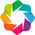

In [ ]:
hv.extension('bokeh')
np.random.seed(42)



In [ ]:
%env HV_DOC_HTML=true

# TT: These are Colab specific
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()



env: HV_DOC_HTML=true


In [ ]:
# Get indicators and countries
indicators = wb.get_indicators()
countries = wb.get_countries()



# Iceland vs Nordic Countries

In [ ]:
# Downloading affected countries
nordic_countries = countries.loc[countries.iso3c.str.contains('ISL') |   # Iceland
                                 #countries.iso3c.str.contains('CHI') |   # Channel Islands
                                 countries.iso3c.str.contains('DNK') |   # Denmark
                                 countries.iso3c.str.contains('FIN') |   # Finland
                                 countries.iso3c.str.contains('GBR') |   # United Kingdom
                                 countries.iso3c.str.contains('GRL') |   # Greenland
                                 countries.iso3c.str.contains('IMN') |   # Isle of Man
                                 countries.iso3c.str.contains('IRL') |   # Ireland
                                 countries.iso3c.str.contains('NLD') |   # Netherlands
                                 countries.iso3c.str.contains('NOR') |   # Norway
                                 countries.iso3c.str.contains('SWE'), :]   # Sweden


In [ ]:
nordic_countries



,iso3c,iso2c,name,region,adminregion,incomeLevel,lendingType,capitalCity,longitude,latitude
76,DNK,DK,Denmark,Europe & Central Asia,,High income,Not classified,Copenhagen,12.568100,55.6763
98,FIN,FI,Finland,Europe & Central Asia,,High income,Not classified,Helsinki,24.952500,60.1608
105,GBR,GB,United Kingdom,Europe & Central Asia,,High income,Not classified,London,-0.126236,51.5002
115,GRL,GL,Greenland,Europe & Central Asia,,High income,Not classified,Nuuk,-51.721400,64.1836
133,IMN,IM,Isle of Man,Europe & Central Asia,,High income,Not classified,Douglas,-4.479280,54.1509
136,IRL,IE,Ireland,Europe & Central Asia,,High income,Not classified,Dublin,-6.267490,53.3441
139,ISL,IS,Iceland,Europe & Central Asia,,High income,Not classified,Reykjavik,-21.895200,64.1353
205,NLD,NL,Netherlands,Europe & Central Asia,,High income,Not classified,Amsterdam,4.890950,52.3738
207,NOR,NO,Norway,Europe & Central Asia,,High income,Not classified,Oslo,10.738700,59.9138
258,SWE,SE,Sweden,Europe & Central Asia,,High income,Not classified,Stockholm,18.064500,59.3327


In [ ]:
# Indicators class

class Indicators:
    def __init__(self, country=['USA'], start='1987-01-01 00:00:00', end='1987-01-01 00:00:00'):
        # This class that initialization parameters for use in all downloads
        self.country = country
        self.start = start
        self.end = end
        self.indicator = None

    def get_indicator(self, indicator='CM.MKT.TRAD.CD',
                      long=True, detrend=False, scale=False, interpolate=True):

        # We download the data
        self.indicator = wb.download(indicator=indicator,
                                    country=self.country,
                                    start=self.start,
                                    end=self.end)
        # reshape it
        self.indicator = self.indicator.reset_index().iloc[::-1,:]\
                                .reset_index(drop=True) if long else self.indicator
        self.indicator = self.indicator\
                    .rename(index=str,
                        columns={indicator: indicators.loc[indicators.id == indicator,'name']\
                                        .tolist()[0]
                                        })
        indicator = indicators.loc[indicators.id == indicator,'name'].tolist()[0]

        # and if required, interpolate missing data
        self.indicator.loc[:,indicator] = self.indicator.groupby('country')[indicator]\
        .apply(lambda x: pd.Series(x).interpolate()) if interpolate else self.indicator

        # detrend the data
        self.indicator.loc[:,indicator] = self.indicator.groupby('country')[indicator]\
        .apply(lambda x: pd.Series(signal.detrend(x)))\
        .reset_index().iloc[:,2].values if detrend else self.indicator

        # scale the data
        self.indicator.loc[:,indicator] = self.indicator.groupby('country')[indicator]\
        .apply(lambda x: (x-x.iloc[0])/iqr(x)) if scale else self.indicator

        # convert the data for easier use
        self.indicator.year = pd.to_numeric(self.indicator.year)

        return self.indicator



In [ ]:
# Initialise nordic countries indicators class
nordic_countries_class = Indicators(country=nordic_countries.iso3c.tolist(),
                                start=pd.to_datetime('1987', yearfirst=True),
                                end=pd.to_datetime('2017', yearfirst=True))

#  The marker for when the crisis takes place
line = hv.VLine(2008).options(color='black', line_width=2)



In [ ]:
### We are going to plot following indicators:

indicators_list = [
    ('GDP',  'NY.GDP.PCAP.KD',  'GDP per capita (constant 2010 US$)'),
    #('B.C2A',  'FB.BNK.CAPA.ZS', 'Bank capital to assets ratio (%)'),
    #('Liq.res2A', 'FD.RES.LIQU.AS.ZS',  'Bank liquid reserves to bank assets ratio (%)'),
    ('Lend_i',  'FR.INR.LEND',  'Lending interest rate (%)'),
    ('Real_i',  'FR.INR.RINR',  'Real interest rate (%)'),
    ('R.ef_Xrate', 'PX.REX.REER',  'Real effective exchange rate index (2010 = 100)'),
    ('M4',  'FM.LBL.BMNY.GD.ZS',  'Broad money (% of GDP)'),
    ('int_Pmnt', 'GC.XPN.INTP.RV.ZS',  'Interest payments (% of revenue)'),
    ('Xrate', 'PA.NUS.FCRF', 'Official exchange rate (LCU per US$, period av...'),
    ('Reserves',  'BN.RES.INCL.CD',  'Reserves and related items (BoP, current US$)'),
    ('Res - gold',  'FI.RES.XGLD.CD',  'Total reserves minus gold (current US$'),
    ('CurrAcc',  'BN.CAB.XOKA.GD.ZS', 'Current account balance (% of GDP)'),
    #('Nt.Cap.Acc',  'BN.TRF.KOGT.CD',  'Net capital account (BoP, current US$)'),
    ('Pr.sect.Credit',  'FD.AST.PRVT.GD.ZS', 'Domestic credit to private sector by banks (% ...'),
    ('Net.Fgn.A',  'FM.AST.NFRG.CN',  'Net foreign assets (current LCU)'),
    ('For.Invest',  'BX.KLT.DINV.WD.GD.ZS',  'Foreign direct investment, net inflows (% of GDP)'),
    ('Inflation',  'FP.CPI.TOTL.ZG',  'Inflation, consumer prices (annual %)')
]



<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
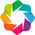

:Layout
   .Overlay.I    :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (GDP per capita (constant 2010 US$))
      .VLine.I     :VLine   [x,y]
   .Overlay.II   :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Lending interest rate (%))
      .VLine.I     :VLine   [x,y]
   .Overlay.III  :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Real interest rate (%))
      .VLine.I     :VLine   [x,y]
   .Overlay.IV   :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Real effective exchange rate index (2010 = 100))
      .VLine.I     :VLine   [x,y]
   .Overlay.V    :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Broad money (% of GDP))
      .VLine.I     :VLine   [x,y]
   .Overlay.VI   :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Interest payments (% of revenue))
      .VLine.I     :VLine   [x,y]
   .Overlay.VII  :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Official exchange rate (LCU per US$, period average))
      .VLine.I     :VLine   [x,y]
   .Overlay.VIII :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Reserves and related items (BoP, current US$))
      .VLine.I     :VLine   [x,y]
   .Overlay.IX   :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Total reserves minus gold (current US$))
      .VLine.I     :VLine   [x,y]
   .Overlay.X    :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Current account balance (% of GDP))
      .VLine.I     :VLine   [x,y]
   .Overlay.XI   :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Domestic credit to private sector by banks (% of GDP))
      .VLine.I     :VLine   [x,y]
   .Overlay.XII  :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Net foreign assets (current LCU))
      .VLine.I     :VLine   [x,y]
   .Overlay.XIII :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Foreign direct investment, net inflows (% of GDP))
      .VLine.I     :VLine   [x,y]
   .Overlay.XIV  :Overlay
      .NdOverlay.I :NdOverlay   [country]
         :Curve   [year]   (Inflation, consumer prices (annual %))
      .VLine.I     :VLine   [x,y]

In [ ]:
# Plots for Nordic countries

allplots_nordic = nordic_countries_class.get_indicator(indicator='NY.GDP.PCAP.KD')\
                            .hvplot.line(x='year', by='country', title=indicators_list[0][2])*line

for i in range(1, len(indicators_list)):
    allplots_nordic = allplots_nordic \
                            + nordic_countries_class.get_indicator(indicator=indicators_list[i][1])\
                        .hvplot.line(x='year', by='country', title=indicators_list[i][2])*line

hv.extension('bokeh')   #Colab specific
allplots_nordic.cols(1)



# Iceland - Economic indicators analysis

## Indicators dataframe

In [ ]:
# GDP
gdp = wb.download(indicator='NY.GDP.PCAP.KD',
                  country=['ISL'],
                  start=pd.to_datetime('1987', yearfirst=True),
                  end=pd.to_datetime('2017', yearfirst=True))
gdp = gdp.reset_index()



In [ ]:
# Form a dataframe of all indicators
factors = wb.download(indicator=[indicators_list[i][1] for i in range(len(indicators_list))],
                         country=['ISL'],
                         start=pd.to_datetime('1987', yearfirst=True),
                         end=pd.to_datetime('2017', yearfirst=True))


In [ ]:
factors.set_index(gdp['year'], inplace=True)
factors.columns = [indicators_list[i][0] for i in range(len(indicators_list))]


In [ ]:
factors

,GDP,Lend_i,Real_i,R.ef_Xrate,M4,int_Pmnt,Xrate,Reserves,Res - gold,CurrAcc,Pr.sect.Credit,Net.Fgn.A,For.Invest,Inflation
year,,,,,,,,,,,,,,
2017,51281.987740,7.255833,7.317670,143.664856,65.953725,10.662804,106.839572,-8.300859e+08,6.483459e+09,3.800521,87.671315,3.746304e+11,-28.583249,1.760416
2016,50188.498420,8.236667,6.225153,128.300105,65.645613,7.560359,120.811548,2.425104e+09,7.152513e+09,7.688437,84.502581,5.290102e+11,-5.147160,1.696928
2015,47405.043171,7.610000,1.880998,114.017115,75.296184,13.477052,131.918708,7.117727e+10,4.972945e+09,5.120582,88.104034,6.953457e+11,6.606068,1.633056
2014,45852.913451,7.742500,3.905149,111.189447,78.698050,12.797734,116.767353,3.588368e+09,4.100125e+09,3.866915,94.816330,6.900632e+11,4.317894,2.044615
2013,45420.990330,8.151667,5.882699,104.037387,78.745145,14.241289,122.179121,1.320512e+08,4.160805e+09,5.774483,107.787211,7.220952e+11,2.947622,3.872279
2012,44032.424537,8.324339,4.722029,99.827440,80.032786,15.963790,125.082787,-9.905731e+08,4.085344e+09,-3.745557,118.055714,6.893933e+11,6.955762,5.185900
2011,43700.792994,7.698072,4.419898,100.922332,87.873534,15.346601,115.954040,-5.121577e+09,8.450365e+09,-5.081611,136.954971,9.369648e+11,7.302543,4.001027
2010,43024.923838,10.257029,3.600505,100.000000,87.364197,16.607051,122.241811,-1.002519e+10,5.698913e+09,-6.438951,160.371155,5.539551e+11,1.878025,5.396731
2009,44491.736012,18.987659,7.316651,96.677465,99.782250,20.652832,123.638381,-1.474321e+10,3.813241e+09,-9.549537,172.451347,3.537772e+11,0.483022,12.003130


## Statistical analysis

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
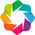

:GridMatrix   [X,Y]
   :Histogram   [int_Pmnt]   (int_Pmnt_frequency)

In [ ]:
# Covariance matrix of factors data
hv.extension('bokeh')   #Colab specific
hvplot.scatter_matrix(factors)



In [ ]:
# Correlation coefficients
factors.corr().style.background_gradient(cmap='coolwarm').format("{:.3%}")



,GDP,Lend_i,Real_i,R.ef_Xrate,M4,int_Pmnt,Xrate,Reserves,Res - gold,CurrAcc,Pr.sect.Credit,Net.Fgn.A,For.Invest,Inflation
GDP,100.000%,-38.234%,-10.197%,-31.668%,85.721%,5.685%,72.050%,17.684%,79.691%,-15.168%,65.935%,39.655%,15.655%,-25.976%
Lend_i,-38.234%,100.000%,10.071%,51.714%,-31.307%,-29.269%,-63.882%,-21.347%,-51.624%,-39.616%,-2.259%,-45.502%,17.248%,87.048%
Real_i,-10.197%,10.071%,100.000%,44.591%,-10.978%,-51.481%,-38.753%,-28.460%,-40.990%,-38.170%,28.831%,-59.810%,29.644%,-32.198%
R.ef_Xrate,-31.668%,51.714%,44.591%,100.000%,-50.253%,-80.088%,-82.019%,-2.676%,-54.808%,-23.751%,-1.551%,-56.407%,10.281%,28.124%
M4,85.721%,-31.307%,-10.978%,-50.253%,100.000%,28.848%,68.973%,2.659%,74.466%,-37.020%,78.528%,45.900%,37.630%,-18.775%
int_Pmnt,5.685%,-29.269%,-51.481%,-80.088%,28.848%,100.000%,59.244%,-2.504%,42.820%,34.320%,-22.350%,45.331%,-28.442%,-0.440%
Xrate,72.050%,-63.882%,-38.753%,-82.019%,68.973%,59.244%,100.000%,22.321%,80.574%,27.946%,22.489%,62.576%,-13.447%,-39.574%
Reserves,17.684%,-21.347%,-28.460%,-2.676%,2.659%,-2.504%,22.321%,100.000%,12.417%,27.706%,-10.174%,17.480%,8.172%,-17.234%
Res - gold,79.691%,-51.624%,-40.990%,-54.808%,74.466%,42.820%,80.574%,12.417%,100.000%,15.643%,32.066%,63.193%,-10.273%,-23.200%
CurrAcc,-15.168%,-39.616%,-38.170%,-23.751%,-37.020%,34.320%,27.946%,27.706%,15.643%,100.000%,-72.399%,17.182%,-59.605%,-20.119%


## PCA analysis

In [ ]:
# Splitting dataframe
gdp_factor = StandardScaler().fit_transform(factors[['GDP']])
explanatory_factors = factors.drop(['GDP'], axis=1)



In [ ]:
# PCA as ML pipeline
pca_pipe = Pipeline(steps=[
    ('imp', SimpleImputer()),
    ('scl', StandardScaler()),
    ('pca', PCA(n_components = explanatory_factors.shape[1]))
])



In [ ]:
# Fit PCA
pca_pipe_results_ef = pca_pipe.fit_transform(explanatory_factors)


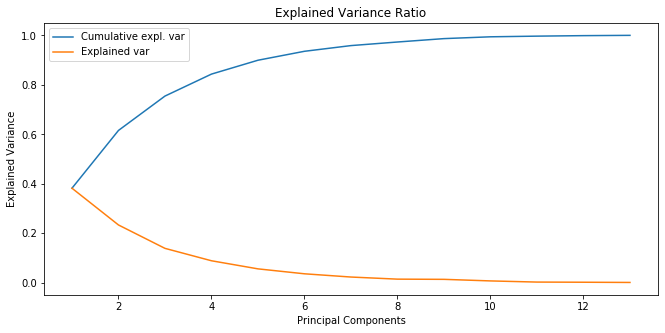

In [ ]:
#Plot PCA for factors
plt.rcParams['figure.figsize'] = [11, 5]

plt.plot(np.arange(1, explanatory_factors.shape[1]+1),
         np.cumsum(pca_pipe.named_steps['pca'].explained_variance_ratio_),
         label='Cumulative expl. var')

plt.plot(np.arange(1, explanatory_factors.shape[1]+1),
         pca_pipe.named_steps['pca'].explained_variance_ratio_,
         label='Explained var')

plt.ylabel('Explained Variance')
plt.xlabel('Principal Components')
plt.title('Explained Variance Ratio')
plt.legend()
plt.show()



In [ ]:
# Explicit PCA coefficients
pca_pipe.named_steps['pca'].explained_variance_ratio_


array([0.38212252, 0.23350719, 0.138945  , 0.08881244, 0.05606974,
       0.03612637, 0.02302138, 0.01450433, 0.01370713, 0.00733981,
       0.00266492, 0.00201641, 0.00116274])

In [ ]:
# PCA cumulative results
n_comp = 5  # TT: pick number of principal components
percent = pca_pipe.named_steps['pca'].explained_variance_ratio_[: n_comp]
percent_cum = np.cumsum(percent)
print('{0:.2f}% '.format(percent_cum[-1]*100),
        ' of the variance is explained by the first {0:.0f} Principal Components'.format(n_comp))



89.95%   of the variance is explained by the first 5 Principal Components


In [ ]:
# Create principal components dataframe
pca_components_ef = pd.DataFrame(pca_pipe_results_ef[:,:5],  # TT: same as n_comp
                                 index=factors.index,
                                  # TT: set same number columns
                                 columns=['Component 1', 'Component 2', 'Component 3',
                                          'Component 4', 'Component 5'
                                          ])

pca_components_ef.sort_index()



,Component 1,Component 2,Component 3,Component 4,Component 5
year,,,,,
1987,-3.009490,-1.697812,1.981374,0.662918,0.445635
1988,-3.376883,-1.770795,3.152869,0.698851,0.412108
1989,-2.277665,-1.792259,2.722671,0.573441,0.048786
1990,-1.137448,-1.991851,1.677063,0.715501,0.079269
1991,-1.567991,-1.149880,-0.089119,-0.166359,-0.102171
1992,-1.314330,-1.104498,-0.941806,-0.253420,0.037649
1993,-1.073288,-1.049712,-1.193962,-0.699298,-0.412230
1994,-0.242454,-1.488603,-1.162789,-0.462585,-0.592016
1995,-0.383994,-1.390157,-1.046229,-0.585819,-0.706167


## Autocorrelation of principal components

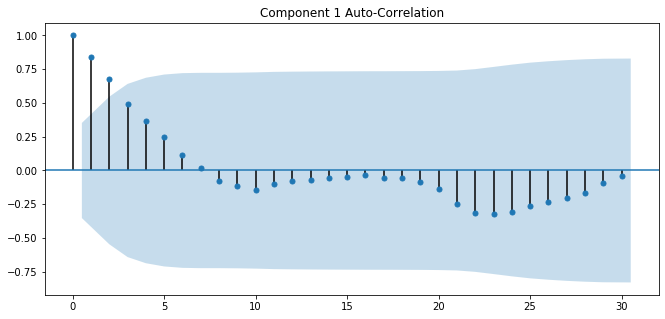

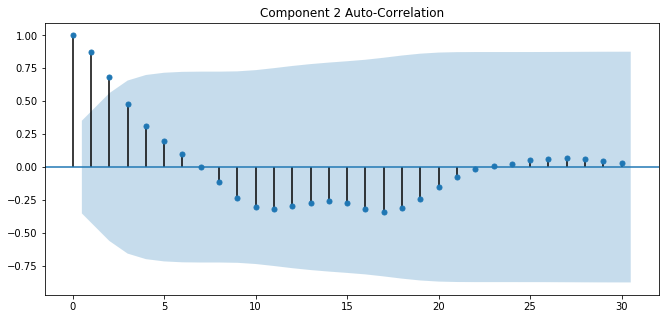

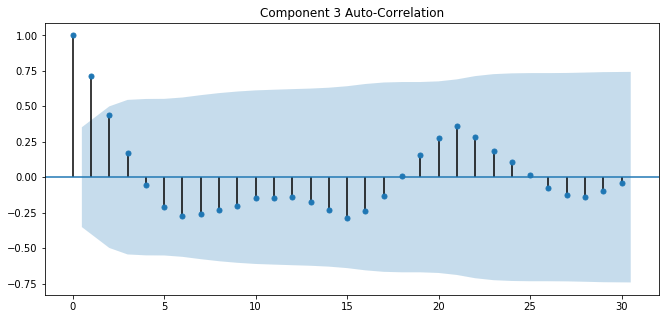

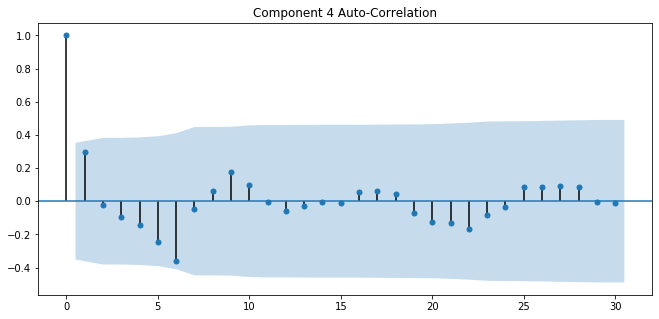

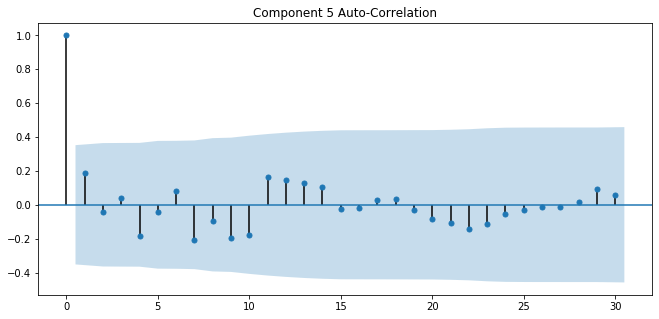

In [ ]:
# Plotting auto-correlation charts

plot_acf(pca_components_ef['Component 1'], lags=30)
plt.title('Component 1 Auto-Correlation')
plt.show()

plot_acf(pca_components_ef['Component 2'], lags=30)
plt.title('Component 2 Auto-Correlation')
plt.show()

plot_acf(pca_components_ef['Component 3'], lags=30)
plt.title('Component 3 Auto-Correlation')
plt.show()

plot_acf(pca_components_ef['Component 4'], lags=30)
plt.title('Component 4 Auto-Correlation')
plt.show()

plot_acf(pca_components_ef['Component 5'], lags=30)
plt.title('Component 5 Auto-Correlation')
plt.show()



In [ ]:
# Computing highest auto-correlations
print('The highest auto-correlation of Component 1 is',
            max(acf(pca_components_ef['Component 1'])[1:]))
print('The highest auto-correlation of Component 2 is',
            max(acf(pca_components_ef['Component 2'])[1:]))
print('The highest auto-correlation of Component 3 is',
            max(acf(pca_components_ef['Component 3'])[1:]))
print('The highest auto-correlation of Component 4 is',
            max(acf(pca_components_ef['Component 4'])[1:]))
print('The highest auto-correlation of Component 5 is',
            max(acf(pca_components_ef['Component 5'])[1:]))



The highest auto-correlation of Component 1 is 0.8385364276051827
The highest auto-correlation of Component 2 is 0.8767011894549738
The highest auto-correlation of Component 3 is 0.710935375735611
The highest auto-correlation of Component 4 is 0.29704546859865755
The highest auto-correlation of Component 5 is 0.18798143428733155


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


## OLS: GDP vs principal components

In [ ]:
OLS_gdp_pc = OLS(gdp_factor, pca_components_ef, hasconst=None)
results = OLS_gdp_pc.fit()
results.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.799
Model:                            OLS   Adj. R-squared (uncentered):              0.760
Method:                 Least Squares   F-statistic:                              20.64
Date:                Wed, 26 Feb 2020   Prob (F-statistic):                    2.64e-08
Time:                        16:27:20   Log-Likelihood:                         -19.139
No. Observations:                  31   AIC:                                      48.28
Df Residuals:                      26   BIC:                                      55.45
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Component 1     0.2660      0.039      6.738      0.000       0.185       0.347
Component 2     0.3242      0.050      6.420      0.000       0.220       0.428
Component 3    -0.0158      0.065     -0.242      0.811      -0.150       0.119
Component 4     0.1505      0.082      1.838      0.077      -0.018       0.319
Component 5     0.3733      0.103      3.622      0.001       0.161       0.585
==============================================================================
Omnibus:                        1.074   Durbin-Watson:                   1.450
Prob(Omnibus):                  0.585   Jarque-Bera (JB):                0.250
Skew:                           0.045   Prob(JB):                        0.883
Kurtosis:                       3.430   Cond. No.                         2.61
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## OLS: GDP vs all factors

In [ ]:
# Lasso linear regression as ML pipe
Lasso_pipe = Pipeline([
    ('imp', SimpleImputer()),
    ('scl', StandardScaler()),
    ('Lreg', LassoCV(fit_intercept=False, random_state=0, cv=3))
])



In [ ]:
# Fit Lasso linear regression
Lasso_results = Lasso_pipe.fit(explanatory_factors, gdp_factor.reshape(-1,))



In [ ]:
# Lasso coefficient matrix
Lasso_coef_matrix = pd.DataFrame(Lasso_results.named_steps['Lreg'].coef_,
                                               (factors.drop(['GDP'], axis=1)).columns,
                                               columns=['coefficient'])

Lasso_coef_matrix = Lasso_coef_matrix[Lasso_coef_matrix['coefficient'] != 0]
Lasso_coef_matrix



,coefficient
R.ef_Xrate,0.228217
M4,0.533479
int_Pmnt,-0.282273
Xrate,0.522494
Res - gold,0.213197
Net.Fgn.A,-0.031887
For.Invest,-0.033956


In [ ]:
# OLS - GDP vs all factors
Lasso_factors = pd.DataFrame(explanatory_factors[Lasso_coef_matrix.index.values],
                             columns=Lasso_coef_matrix.index.values)

OLS_gdp_all = OLS(gdp_factor, Lasso_factors, hasconst=None)
results = OLS_gdp_all.fit()
results.summary()



<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.928
Model:                            OLS   Adj. R-squared (uncentered):              0.907
Method:                 Least Squares   F-statistic:                              44.44
Date:                Wed, 26 Feb 2020   Prob (F-statistic):                    3.23e-12
Time:                        16:27:45   Log-Likelihood:                         -3.1230
No. Observations:                  31   AIC:                                      20.25
Df Residuals:                      24   BIC:                                      30.28
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
R.ef_Xrate    -0.0076      0.001     -5.161      0.000      -0.011      -0.005
M4             0.0267      0.005      5.064      0.000       0.016       0.038
int_Pmnt      -0.1559      0.020     -7.917      0.000      -0.196      -0.115
Xrate          0.0108      0.004      2.741      0.011       0.003       0.019
Res - gold  1.395e-10   4.74e-11      2.945      0.007    4.17e-11    2.37e-10
Net.Fgn.A  -3.258e-13   1.75e-13     -1.860      0.075   -6.87e-13    3.58e-14
For.Invest    -0.0186      0.009     -2.105      0.046      -0.037      -0.000
==============================================================================
Omnibus:                        3.902   Durbin-Watson:                   1.775
Prob(Omnibus):                  0.142   Jarque-Bera (JB):                1.576
Skew:                           0.036   Prob(JB):                        0.455
Kurtosis:                       1.898   Cond. No.                     1.65e+11
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.65e+11. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
# 'Net.Fgn.A' and 'For.Invest' tested to be statisticaly insignificant
# so drop those and rerun OLS
Lasso_factors = Lasso_factors.drop(['Net.Fgn.A', 'For.Invest'], axis=1)


In [ ]:
OLS_gdp_all = OLS(gdp_factor, Lasso_factors, hasconst=None)
results = OLS_gdp_all.fit()
results.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.907
Model:                            OLS   Adj. R-squared (uncentered):              0.890
Method:                 Least Squares   F-statistic:                              50.96
Date:                Wed, 26 Feb 2020   Prob (F-statistic):                    1.30e-12
Time:                        16:32:05   Log-Likelihood:                         -7.1054
No. Observations:                  31   AIC:                                      24.21
Df Residuals:                      26   BIC:                                      31.38
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
R.ef_Xrate    -0.0063      0.002     -4.207      0.000      -0.009      -0.003
M4             0.0191      0.004      4.785      0.000       0.011       0.027
int_Pmnt      -0.1514      0.021     -7.225      0.000      -0.195      -0.108
Xrate          0.0119      0.004      2.857      0.008       0.003       0.020
Res - gold  1.576e-10    4.5e-11      3.505      0.002    6.52e-11     2.5e-10
==============================================================================
Omnibus:                        2.088   Durbin-Watson:                   1.885
Prob(Omnibus):                  0.352   Jarque-Bera (JB):                0.932
Skew:                           0.242   Prob(JB):                        0.627
Kurtosis:                       3.698   Cond. No.                     1.13e+09
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.13e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Feature importance

In [ ]:
# Decision Tree Regressor as ML pipe
DTR_pipe = Pipeline([
    ('imp', SimpleImputer()),
    ('scl', StandardScaler()),
    ('dtr', DecisionTreeRegressor())
])



In [ ]:
# Fit Decision Tree Regressor
Lasso_coef_matrix = Lasso_coef_matrix.drop(['Net.Fgn.A', 'For.Invest'], axis=0)
D_tree = DTR_pipe.fit(explanatory_factors[Lasso_coef_matrix.index.values], gdp_factor)

# Model dataframe
pd.DataFrame(D_tree.named_steps['dtr'].feature_importances_,
             Lasso_coef_matrix.index.values,
             columns=['importance'])


,importance
R.ef_Xrate,0.016336
M4,0.013556
int_Pmnt,0.003495
Xrate,0.090927
Res - gold,0.875686


# Macroeconomic analysis - Transition mechanisms

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
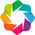

:Layout
   .Overlay.I    :Overlay
      .Curve.I :Curve   [year]   (GDP)
      .VLine.I :VLine   [x,y]
   .Overlay.II   :Overlay
      .Curve.I :Curve   [year]   (Lend_i)
      .VLine.I :VLine   [x,y]
   .Overlay.III  :Overlay
      .Curve.I :Curve   [year]   (Real_i)
      .VLine.I :VLine   [x,y]
   .Overlay.IV   :Overlay
      .Curve.I :Curve   [year]   (R.ef_Xrate)
      .VLine.I :VLine   [x,y]
   .Overlay.V    :Overlay
      .Curve.I :Curve   [year]   (M4)
      .VLine.I :VLine   [x,y]
   .Overlay.VI   :Overlay
      .Curve.I :Curve   [year]   (int_Pmnt)
      .VLine.I :VLine   [x,y]
   .Overlay.VII  :Overlay
      .Curve.I :Curve   [year]   (Xrate)
      .VLine.I :VLine   [x,y]
   .Overlay.VIII :Overlay
      .Curve.I :Curve   [year]   (Reserves)
      .VLine.I :VLine   [x,y]
   .Overlay.IX   :Overlay
      .Curve.I :Curve   [year]   (Res - gold)
      .VLine.I :VLine   [x,y]
   .Overlay.X    :Overlay
      .Curve.I :Curve   [year]   (CurrAcc)
      .VLine.I :VLine   [x,y]
   .Overlay.XI   :Overlay
      .Curve.I :Curve   [year]   (Pr.sect.Credit)
      .VLine.I :VLine   [x,y]
   .Overlay.XII  :Overlay
      .Curve.I :Curve   [year]   (Net.Fgn.A)
      .VLine.I :VLine   [x,y]
   .Overlay.XIII :Overlay
      .Curve.I :Curve   [year]   (For.Invest)
      .VLine.I :VLine   [x,y]
   .Overlay.XIV  :Overlay
      .Curve.I :Curve   [year]   (Inflation)
      .VLine.I :VLine   [x,y]

In [ ]:
# Plots

vline = hv.VLine(21.5).options(color='black', line_width=1.5)

plots_isl = factors['GDP'].sort_index().reset_index()\
                .hvplot.line(x='year', y=indicators_list[0][0], title=indicators_list[0][2]) \
                *vline

for i in range(1, len(indicators_list)):
    plots_isl = plots_isl + factors[indicators_list[i][0]].sort_index().reset_index()\
                .hvplot.line(x='year', y=indicators_list[i][0], title=indicators_list[i][2])\
                *vline

hv.extension('bokeh')   #Colab specific
plots_isl.cols(1)



In [ ]:
# We will then test validity of some transition mechanisms

"""
TT:  These remaining topics will be discussed in paper.
"""



$$\downarrow i \rightarrow \uparrow  C, I \rightarrow \uparrow  Y $$
$$\text{(raise output)}$$


$$\downarrow i \rightarrow \uparrow B $$
$$\text{(raise value of securities)}$$


$$ \uparrow M_{s} \rightarrow \downarrow E \rightarrow \uparrow (X-M) ,Y $$



In [ ]:
(lending_rate_plot + investment_plot + gdp_plot).cols(1)

(lending_rate_plot + bonds_plot).cols(1)

(money_plot + exchange_plot + XM_plot).cols(1)